# Using `vlm-1` to understand financial TV news

In this notebook, we will use the `vlm-1` model to understand financial TV news. 

## 0. Setup

In [ ]:
# Install dependencies if needed
# The torch-nos package provides tools for reading videos
!pip install requests Pillow torch-nos pytube

## 1. `vlm` API

We will call the  `vlm-1` API using the Python `requests` library. We will use the `generate` endpoint of the API to extract visual information from TV news broadcasts.

Let's first test the `health` of the API.

In [2]:
import os
import requests


VLM_BASE_URL = "https://vlm-dev.nos.run/v1"
response = requests.get(f"{VLM_BASE_URL}/health")
response.raise_for_status()
assert response.status_code == 200

## 2. Authentication

If you are using the API for the first time, you may need to [sign up for an API key](typeform-link).

In [3]:
VLM_API_KEY = os.getenv("VLM_API_KEY", None)
if VLM_API_KEY is None:
    VLM_API_KEY = input()
print(f"Using API key: {VLM_API_KEY[:4]}...")

Using API key: sk-s...


## 3. `vlm_tools` Helper Functions

In this section, we will define some helper functions to make it easier to interact with the `vlm-1` API and YouTube.

In [8]:
# %load ../vlm_tools/image.py
import json
from base64 import b64encode
from io import BytesIO
from typing import Literal, Union

import requests
from PIL import Image


def pprint(data):
    print(json.dumps(data, indent=2))


def encode_image(image: Image.Image, format: Literal["PNG", "JPEG"] = "PNG") -> Union[str, bytes]:
    """Convert an image to a base64 string."""
    buffered = BytesIO()
    image_format = image.format or format
    image.save(buffered, format=image_format)
    img_str = b64encode(buffered.getvalue()).decode()
    return f"data:image/{image_format.lower()};base64,{img_str}"


def download_image(url: str) -> Image.Image:
    """Download an image from a URL."""
    headers = {
        "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:106.0) Gecko/20100101 Firefox/106.0",
        "Accept": "text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,*/*;q=0.8",
    }
    bytes = BytesIO(requests.get(url, headers=headers).content)
    bytes.seek(0)
    return Image.open(bytes).convert("RGB")


In [16]:
# %load ../vlm_tools/youtube.py
import logging
from itertools import islice
from pathlib import Path
from typing import Iterable

from nos.common.io import VideoReader
from PIL import Image
from pytube import Playlist, YouTube

logger = logging.getLogger(__name__)


DEFAULT_DOWNLOAD_DIR = Path.home() / "data"
DEFAULT_DOWNLOAD_DIR.mkdir(parents=True, exist_ok=True)


def yt_playlist(playlist_url: str, start: int = 0, end: int = 100) -> list:
    """Get all URLs from a YouTube playlist"""
    playlist = Playlist(playlist_url)
    # This forces pytube to fetch all the video URLs in the playlist
    playlist._video_regex = None
    return list(playlist.video_urls)[start:end]


def yt_download(url: str, output_directory: str = DEFAULT_DOWNLOAD_DIR, height: int = 720):
    # Convert output directory to Path object and ensure it exists
    output_directory = Path(output_directory)
    output_directory.mkdir(parents=True, exist_ok=True)

    # Create YouTube object
    yt = YouTube(url)

    # Filter the streams to mp4 and sort by resolution
    stream = yt.streams.filter(file_extension="mp4", progressive=True).order_by("resolution").desc().first()

    # If a specific height is requested, try to honor that, but fall back to the highest available if not found
    if height:
        preferred_stream = yt.streams.filter(res=f"{height}p", file_extension="mp4", progressive=True).first()
        if preferred_stream:
            stream = preferred_stream

    # Prepare filename
    path = output_directory / f"{yt.video_id}.mp4"

    # Download video if file does not exist
    if not path.exists():
        logger.info(f"Downloading '{yt.title}' to '{path}'")
        stream.download(output_path=output_directory, filename=path.name)
    else:
        logger.info(f"File '{path}' already exists, skipping download.")

    return str(path)


def yt_sample_video(url: str, start: int = 0, end: int = None, skip: int = 300) -> Iterable[Image.Image]:
    # Download the video
    logger.info(f"Downloading video ... [url={url}]")
    path = yt_download(url)

    # Extract frames from the video
    video = VideoReader(path)
    assert len(video) > 0 and len(video) <= 30 * 10 * 60, f"Invalid video length: {len(video)}"
    frames = islice(VideoReader(path), start, end, skip)
    logger.info(f"Processing video ... [video={video}]")
    for frame in frames:
        yield Image.fromarray(frame).convert("RGB")


In [22]:
from pathlib import Path
from typing import Union

from PIL import Image
from IPython.display import display


headers = {
    "Content-Type": "application/json",
    "X-API-Key": VLM_API_KEY,
}

def vlm(image: Image.Image, domain: str):
    """Send an image to the VLM API."""
    data = {
        "model": "vlm-1",
        "domain": domain,
        "image": encode_image(image),
    }
    response = requests.post(f"{VLM_BASE_URL}/generate", headers=headers, json=data)
    response.raise_for_status()
    return response.json()


def vlm_visualize(image: Union[Image.Image, str, Path], domain: str):
    """Send an image to the VLM API and display the result."""
    if isinstance(image, str) and image.startswith("http"):
        image = download_image(image)
    elif isinstance(image, (str, Path)):
        if not Path(image).exists():
            raise FileNotFoundError(f"File not found {image}")
        image = Image.open(str(image)).convert("RGB")
    elif isinstance(image, Image.Image):
        image = image.convert("RGB")
    else:
        raise ValueError(f"Invalid image, must be a path, PIL Image or URL, got {type(image)}")

    try:
        W, H = image.size
        display(image.resize((W // 2, H // 2)))
        result = vlm(image, domain)
        pprint(result)
    except Exception:
        return

## 3. Mine financial TV news broadcasts on YouTube

Now, let's mine financial TV news broadcasts on YouTube. We will use the `pytube` library to download a sample financial TV news broadcast and extract relevant metadata using the `vlm-1` API.

In [20]:
from IPython.display import YouTubeVideo

# Bloomberg: Compared to other speculative assets, Bitcoin isn't unique right now: Richard Bernstein's Dan Suzuki
url = "https://www.youtube.com/watch?v=JmX10FBqH_M"
YouTubeVideo(url)

Now, let's analyze some frames from the video. Note, here we skip the first second, and sample every 5 seconds and send the frames to the `vlm-1` API for analysis.

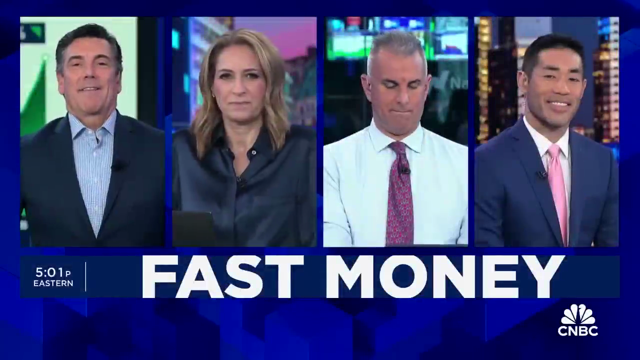

{
  "cls_name": "SceneDescription",
  "scene": "The image shows four individuals, likely television hosts or panelists, appearing in separate frames combined into one screen. They are dressed in business attire, suggesting a professional setting. The background of each frame varies, with some showing financial charts and cityscapes. The overall setting appears to be a financial news broadcast.",
  "chyron": "FAST MONEY | 5:01p EASTERN",
  "plots": null,
  "tables": null,
  "reporters": null,
  "quotes": null,
  "others": [
    "The logo of CNBC is visible in the bottom right corner, indicating the network broadcasting the show.",
    "The time '5:01p' suggests the image was captured just after the hour, likely indicating the start of the program."
  ]
}


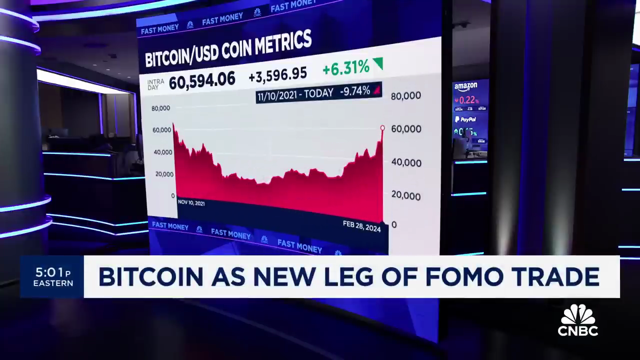

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a television studio with a large screen displaying a graph and information about Bitcoin/USD coin metrics. The studio has a modern design with blue lighting accents.",
  "chyron": "BITCOIN AS NEW LEG OF FOMO TRADE",
  "plots": [
    {
      "cls_name": "Plot",
      "type": "line",
      "title": "BITCOIN/USD COIN METRICS",
      "description": "A line graph showing the price movement of Bitcoin against the US dollar from November 10, 2021, to February 28, 2024. The graph indicates a significant increase in price with a peak near the end of the displayed timeline.",
      "markdown": "![Bitcoin/USD Coin Metrics Line Graph](image_url)",
      "caption": null
    }
  ],
  "tables": null,
  "reporters": null,
  "quotes": null,
  "others": [
    "The time displayed in the bottom left corner is '5:01p Eastern'.",
    "The screen also shows additional information such as the intraday value of Bitcoin, the change in value, and th

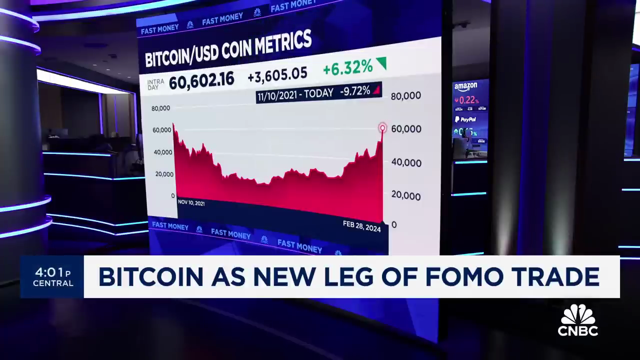

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a television studio with a large screen displaying a graph. The graph is titled 'BITCOIN/USD COIN METRICS' and shows a line chart with a red fill underneath the line, indicating the price movement of Bitcoin in USD. The chart shows a significant increase in price with a peak and a subsequent drop. The studio has blue lighting accents and there are multiple screens visible in the background.",
  "chyron": "BITCOIN AS NEW LEG OF FOMO TRADE",
  "plots": [
    {
      "cls_name": "Plot",
      "type": "line",
      "title": "BITCOIN/USD COIN METRICS",
      "description": "A line chart with a red fill showing the price movement of Bitcoin against the US dollar. The chart indicates a peak and a subsequent drop in the price.",
      "markdown": "![Bitcoin/USD Coin Metrics Line Chart](image_url)",
      "caption": null
    }
  ],
  "tables": null,
  "reporters": null,
  "quotes": null,
  "others": [
    "The studio setting with b

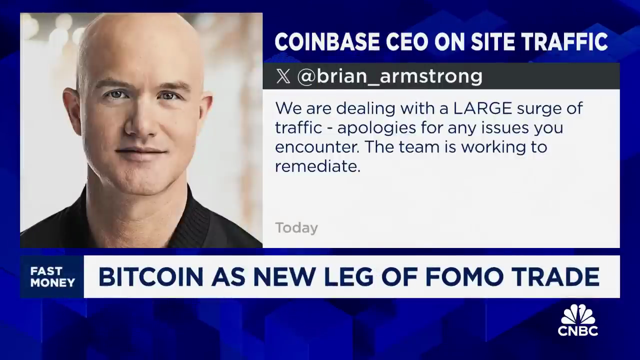

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a television news segment with a graphic overlay. On the left side, there is a headshot of a bald man with a neutral expression, wearing a black shirt. On the right side, there is a text box with a tweet from a user named @brian_armstrong. The tweet reads: 'We are dealing with a LARGE surge of traffic - apologies for any issues you encounter. The team is working to remediate. Today.' The bottom of the screen has a blue banner with text that reads 'BITCOIN AS NEW LEG OF FOMO TRADE' and the CNBC logo on the right.",
  "chyron": "BITCOIN AS NEW LEG OF FOMO TRADE",
  "plots": null,
  "tables": null,
  "reporters": null,
  "quotes": [
    {
      "cls_name": "Quote",
      "text": "We are dealing with a LARGE surge of traffic - apologies for any issues you encounter. The team is working to remediate.",
      "speaker": "@brian_armstrong",
      "designation": null,
      "is_name_shown": true
    }
  ],
  "others": [
    "CNBC 

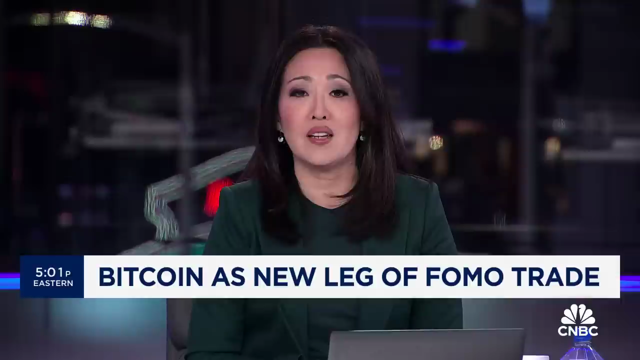

{
  "cls_name": "SceneDescription",
  "scene": "A female reporter is sitting at a news desk in a studio. She appears to be speaking or reporting. The studio has a dark background with blurred lights and screens.",
  "chyron": "BITCOIN AS NEW LEG OF FOMO TRADE",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "Name not displayed",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": null
}


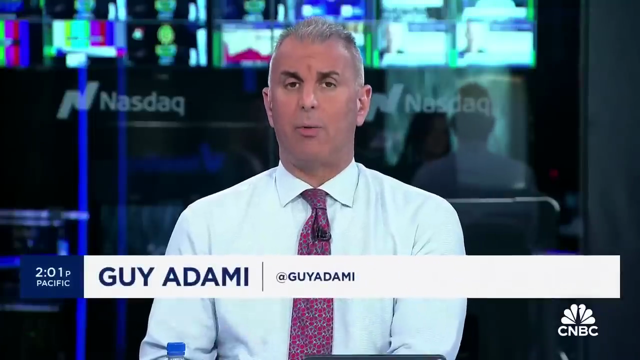

{
  "cls_name": "SceneDescription",
  "scene": "A man in a white shirt and patterned tie is sitting in front of a background showing the Nasdaq logo and various colorful financial data screens. He appears to be speaking or presenting.",
  "chyron": null,
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "GUY ADAMI",
      "is_name_shown": true
    }
  ],
  "quotes": null,
  "others": null
}


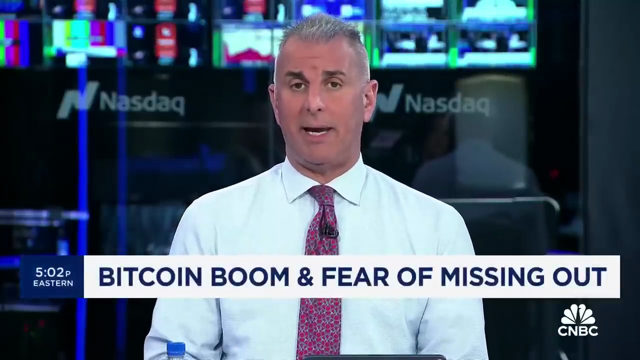

{
  "cls_name": "SceneDescription",
  "scene": "A man in a white shirt and patterned tie is standing in front of a background showing the NASDAQ stock market screens. He appears to be speaking or reporting.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "The name of the reporter is not displayed in the image.",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "The image is taken from a television broadcast, as indicated by the CNBC logo in the corner."
  ]
}


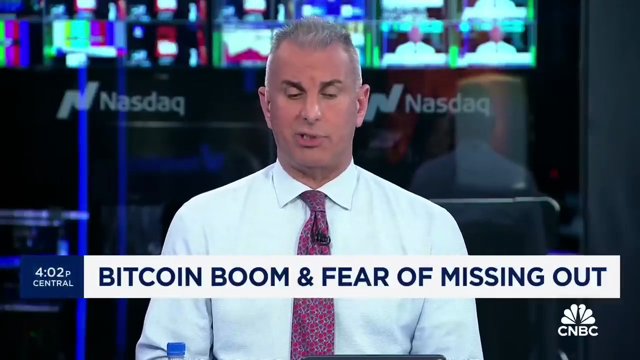

{
  "cls_name": "SceneDescription",
  "scene": "A man in a white shirt and patterned tie is in a television studio with multiple screens displaying financial data in the background. The screens are blurry, but colors and shapes suggest a financial setting, possibly a stock exchange.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "The name of the reporter is not displayed in the image.",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "The logo of CNBC is visible in the bottom right corner, indicating the network broadcasting this segment.",
    "The time '4:02p Central' is displayed, indicating the time and time zone when this was broadcasted."
  ]
}


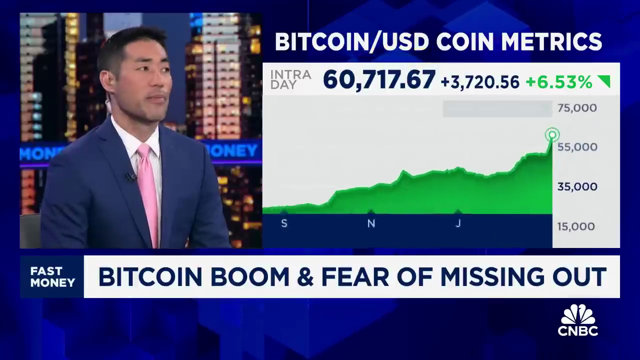

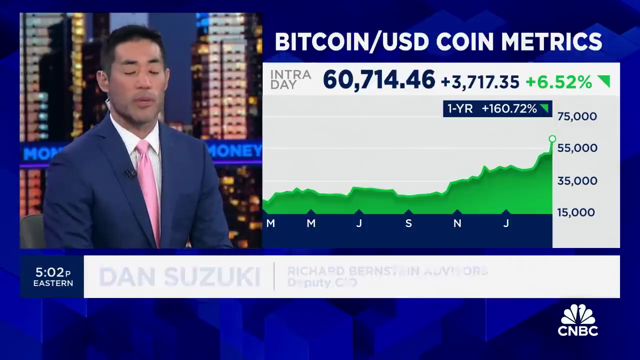

{
  "cls_name": "SceneDescription",
  "scene": "A man in a suit is speaking on a television program. The background suggests an urban night skyline. There is a graphic overlay on the right side of the screen displaying a green upward-trending line chart with data points and text related to Bitcoin/USD coin metrics.",
  "chyron": "5:02p EASTERN | DAN SUZUKI | RICHARD BERNSTEIN ADVISORS | Deputy CIO",
  "plots": [
    {
      "cls_name": "Plot",
      "type": "line",
      "title": "BITCOIN/USD COIN METRICS",
      "description": "A line chart showing the intraday value of Bitcoin against the USD. The chart indicates a positive trend with the current value at 60,714.46, which is up by 3,717.35 points or 6.52%. The chart also shows a 1-year increase of 160.72%.",
      "markdown": "Intra Day | 60,714.46 +3,717.35 +6.52% | 1-YR +160.72%",
      "caption": null
    }
  ],
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "DAN SUZUKI",
      "is_name_shown"

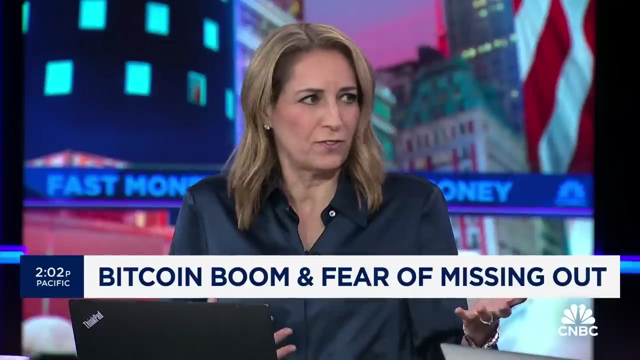

{
  "cls_name": "SceneDescription",
  "scene": "A woman is sitting in a studio with a blurred background showing a cityscape and the text 'FAST MONEY' on a screen. She appears to be engaged in a discussion or interview, looking slightly to her right with a serious expression. She is wearing a dark shirt and has a laptop in front of her.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "[The reporter's name is not displayed in the image]",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "The image is from a television broadcast, specifically from CNBC as indicated by the logo in the bottom right corner.",
    "The time '2:02p PACIFIC' is displayed in the top left corner, indicating the time of the broadcast."
  ]
}


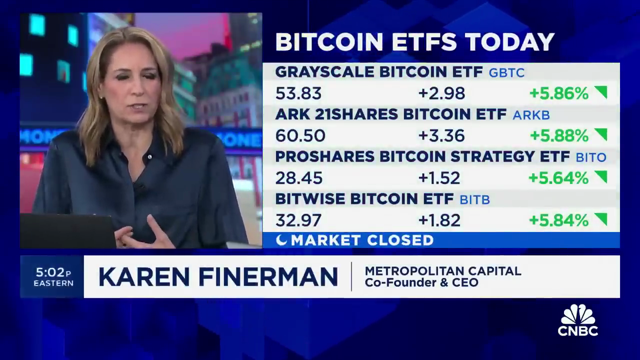

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a television news segment with a female reporter discussing financial information. The reporter is seated, facing slightly to the right, and appears to be speaking. She is dressed in a dark blouse and is in front of a background that resembles a news studio with colorful blurred lights. There is a laptop in front of her.",
  "chyron": "5:02p Eastern KAREN FINERMAN MARKET CLOSED",
  "plots": null,
  "tables": [
    {
      "cls_name": "Table",
      "title": "BITCOIN ETFS TODAY",
      "description": "A table displaying the performance of various Bitcoin ETFs with their names, current values, and the percentage change. All ETFs listed are showing a positive percentage change indicated by green up arrows.",
      "markdown": "| ETF Name | Value | Change |\n| --- | --- | --- |\n| GRAYSCALE BITCOIN ETF GBTC | 53.83 | +2.98 (+5.86%) |\n| ARK 21SHARES BITCOIN ETF ARKB | 60.50 | +3.36 (+5.88%) |\n| PROSHARES BITCOIN STRATEGY ETF 

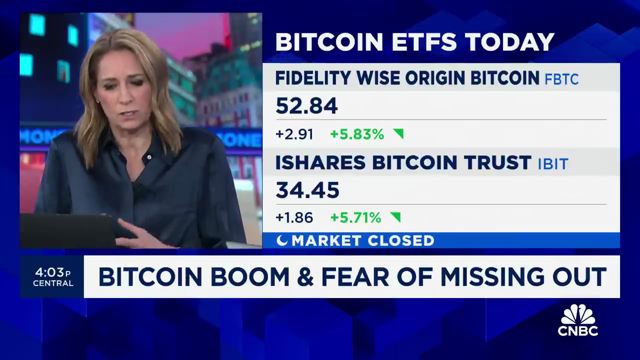

{
  "cls_name": "SceneDescription",
  "scene": "A female reporter is looking down at a laptop, seemingly engaged in reading or research. She is wearing a dark blouse and is situated in a news studio with a blurred background featuring what appears to be a cityscape and studio lights. The overall lighting is bright, typical of a television studio environment.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": [
    {
      "cls_name": "Table",
      "title": "BITCOIN ETFS TODAY",
      "description": "The table displays information about two Bitcoin ETFs. The first row shows 'FIDELITY WISE ORIGIN BITCOIN FBTC' with a value of 52.84, a change of +2.91, and a percentage change of +5.83%. The second row shows 'ISHARES BITCOIN TRUST IBIT' with a value of 34.45, a change of +1.86, and a percentage change of +5.71%. Both rows have a green upward-pointing arrow indicating an increase in value. The bottom of the table indicates that the market is closed.",
      "m

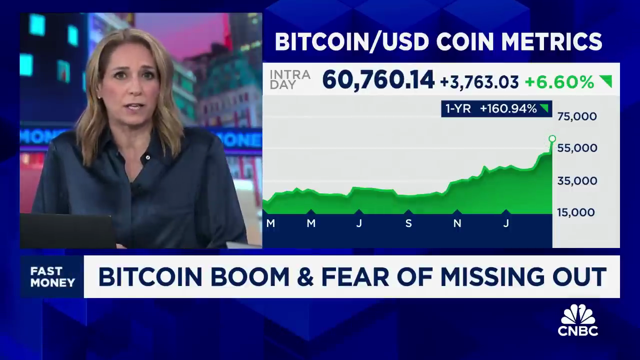

{
  "cls_name": "SceneDescription",
  "scene": "A news reporter is on screen with a graphic showing Bitcoin/USD coin metrics. The background suggests a financial news setting.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": [
    {
      "cls_name": "Plot",
      "type": "line",
      "title": "BITCOIN/USD COIN METRICS",
      "description": "A line graph showing the intraday value of Bitcoin against the USD with a significant upward trend over a one-year period, marked with a +160.94% increase.",
      "markdown": "INTRA DAY\n60,760.14 +3,763.03 +6.60%\n1-YR +160.94%",
      "caption": null
    }
  ],
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "The reporter's name is not shown in the image.",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "The logo of CNBC is visible in the bottom right corner, indicating the network broadcasting this segment.",
    "The segment is titled 'FAST MONEY' as seen in the 

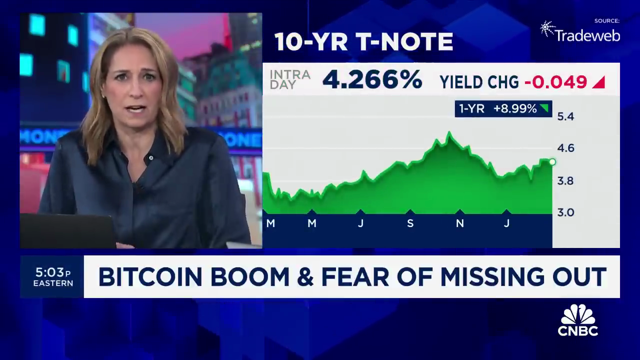

{
  "cls_name": "SceneDescription",
  "scene": "A news reporter is seen on the left side of the image with a concerned expression, looking slightly off-camera. She is wearing a dark blue blouse and is seated in front of a laptop. On the right side of the image, there is a graphic of a green line chart representing the '10-YR T-NOTE' with a current value of 4.266% and a 'YIELD CHG' of -0.049. The chart shows an upward trend over time, with a label '1-YR +8.99%' in the upper right corner. The background suggests a news studio environment with blue and pink lighting and blurred cityscape.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": [
    {
      "cls_name": "Plot",
      "type": "line",
      "title": "10-YR T-NOTE",
      "description": "A line chart showing the intraday value of the 10-year Treasury Note with a current value of 4.266% and a year-to-date change of -0.049. The chart also indicates a 1-year change of +8.99%.",
      "markdown": "10-YR T-NOTE\n\n- Current

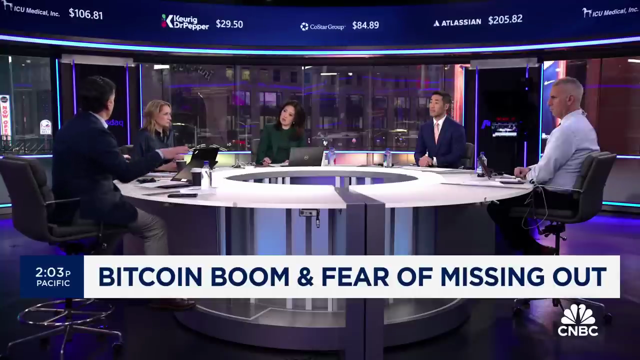

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a television studio with five individuals seated around a circular desk. Four of them appear to be engaged in a discussion or news broadcast. The studio has a modern design with screens displaying stock prices in the background. The time '2:03p Pacific' is shown in the bottom left corner, indicating the live broadcast time.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "Not displayed",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "Stock prices displayed on screens in the background",
    "CNBC logo visible in the bottom right corner"
  ]
}


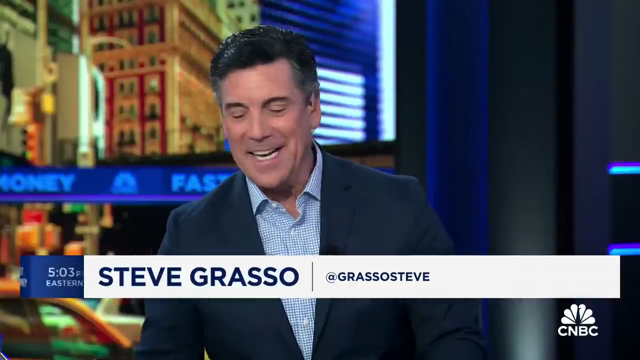

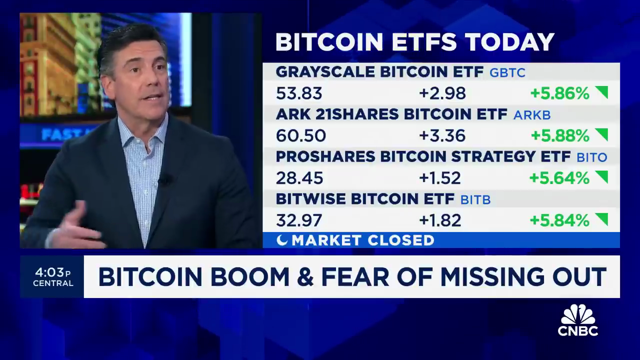

{
  "cls_name": "SceneDescription",
  "scene": "A man in a suit is speaking on a television program. The background is a studio setting with screens displaying financial data. The man appears to be a financial analyst or reporter discussing market-related topics.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": [
    {
      "cls_name": "Table",
      "title": "BITCOIN ETFS TODAY",
      "description": "A table displaying the performance of various Bitcoin ETFs with their names, last price, change in price, and percentage change. All ETFs are showing a positive percentage change indicated by green up arrows.",
      "markdown": "| ETF Name | Last Price | Change | % Change |\n| --- | --- | --- | --- |\n| GRAYSCALE BITCOIN ETF GBTC | 53.83 | +2.98 | +5.86% |\n| ARK 21SHARES BITCOIN ETF ARKB | 60.50 | +3.36 | +5.88% |\n| PROSHARES BITCOIN STRATEGY ETF BITO | 28.45 | +1.52 | +5.64% |\n| BITWISE BITCOIN ETF BITB | 32.97 | +1.82 | +5.84% |",
      "caption": n

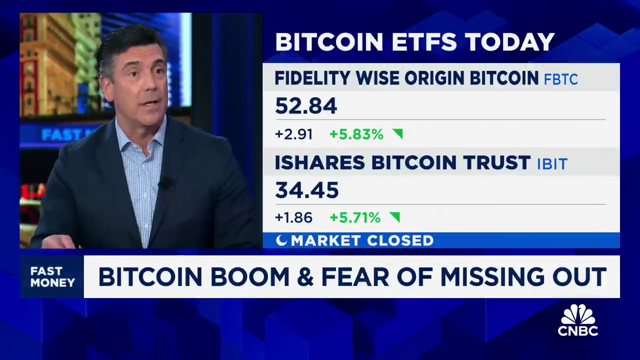

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a television news segment with a male reporter on the left side of the screen. He is wearing a dark suit and a checkered shirt. On the right side of the screen, there is a graphic displaying information about Bitcoin ETFs. The background suggests a studio setting with a blurred image of a cityscape.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": [
    {
      "cls_name": "Table",
      "title": "BITCOIN ETFs TODAY",
      "description": "The table lists two Bitcoin ETFs with their respective prices and daily performance percentages. Both ETFs show a positive performance for the day.",
      "markdown": "| ETF Name | Price | Change | Percentage Change |\n| --- | --- | --- | --- |\n| FIDELITY WISE ORIGIN BITCOIN FBTC | 52.84 | +2.91 | +5.83% |\n| ISHARES BITCOIN TRUST IBIT | 34.45 | +1.86 | +5.71% |",
      "caption": "Market Closed"
    }
  ],
  "reporters": [
    {
      "cls_name": "Repor

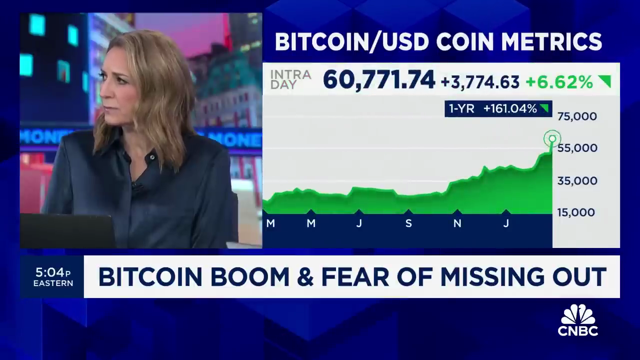

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a television news segment with a female reporter on the left side of the screen. She is looking towards the right and appears to be engaged in a discussion or interview. On the right side of the screen, there is a large graphic displaying a line chart with the title 'BITCOIN/USD COIN METRICS'. The chart shows a significant upward trend in the value of Bitcoin, with the latest price listed as 60,771.74 USD, which is up by 3,774.63 USD or 6.62%. The chart also indicates a 1-year increase of 161.04%. Below the chart, there is a chyron that reads 'BITCOIN BOOM & FEAR OF MISSING OUT'. The network logo 'CNBC' is visible in the bottom right corner.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": [
    {
      "cls_name": "Plot",
      "type": "line",
      "title": "BITCOIN/USD COIN METRICS",
      "description": "A line chart showing the intraday price of Bitcoin at 60,771.74 USD, with an increase of 3,774.63 USD 

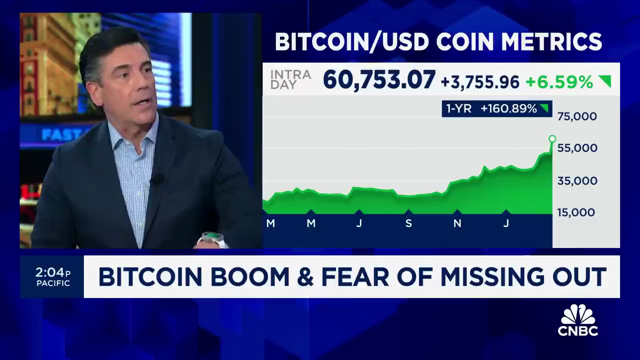

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a television news segment with a male reporter on the left side of the screen. He is wearing a dark suit and a checkered shirt. On the right side of the screen, there is a graphic displaying the Bitcoin/USD coin metrics. The graphic is a line chart showing an upward trend in the value of Bitcoin over time, with the current price highlighted. The background of the studio is blurred, but it appears to be a newsroom.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": [
    {
      "cls_name": "Plot",
      "type": "line",
      "title": "Bitcoin/USD Coin Metrics",
      "description": "A line chart showing the price of Bitcoin in USD over time, indicating a significant upward trend. The chart includes a 1-year percentage gain and the current price with the day's gain.",
      "markdown": "Intra Day\n60,753.07 +3,755.96 +6.59%\n1-YR +160.89%",
      "caption": null
    }
  ],
  "tables": null,
  "reporters": [
    

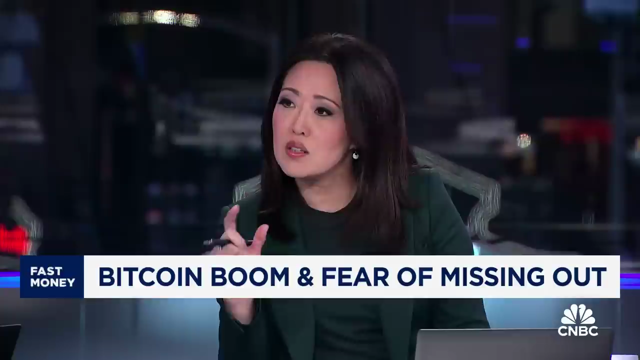

{
  "cls_name": "SceneDescription",
  "scene": "A woman appears to be speaking on a television program. She is dressed in a green top and is seated in a studio with a dark background. The woman seems to be in the middle of a discussion or providing commentary.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "The name of the reporter is not displayed in the image.",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "The logo of CNBC is visible in the bottom right corner, indicating the network on which the program is being broadcasted."
  ]
}


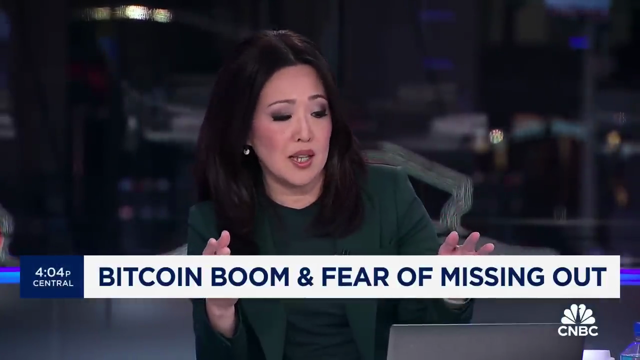

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a female reporter on a news broadcast. She appears to be speaking and gesturing with her hands. The background is blurred but suggests an indoor setting with screens and possibly a newsroom or studio environment.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "The reporter's name is not displayed in the image.",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "The time displayed on the chyron is 4:04 PM with a label 'CENTRAL' indicating the time zone."
  ]
}


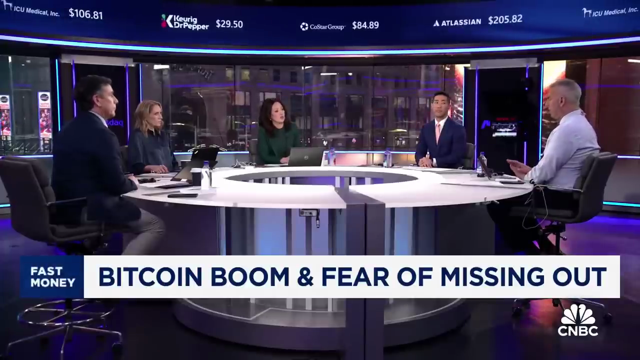

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a television studio with five individuals seated around a circular desk. Four of them are facing the camera, while one is seen from the back. The studio has a modern design with screens displaying stock prices in the background. The overall setting suggests a financial news program.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "The names of the individuals are not provided in the image.",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "The ticker at the top of the image displays stock prices for various companies such as ICU Medical, Inc., Keurig Dr Pepper, CoStar Group, and Atlassian."
  ]
}


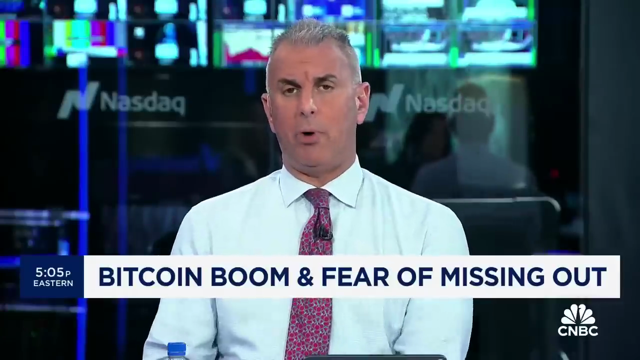

{
  "cls_name": "SceneDescription",
  "scene": "A man in a white shirt and patterned tie is speaking on a television program. In the background, there are multiple screens displaying colorful graphics, likely related to stock market data. The setting appears to be a newsroom or a broadcast studio, specifically the NASDAQ as indicated by the signage.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "The name of the reporter is not displayed in the image.",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "The image is from CNBC as indicated by the logo in the bottom right corner.",
    "The time displayed is 5:05 p Eastern, suggesting the time the program was aired or the segment was recorded."
  ]
}


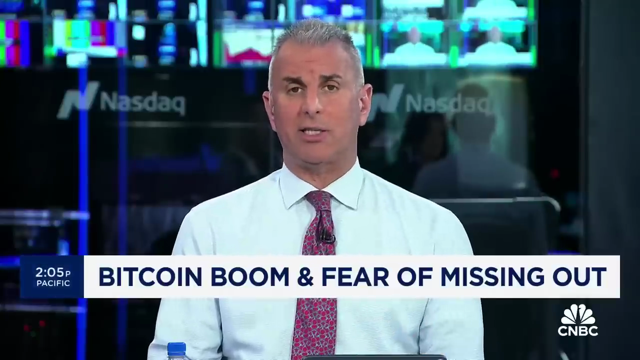

{
  "cls_name": "SceneDescription",
  "scene": "A man in a white shirt and patterned tie is sitting in a studio with multiple screens displaying financial data in the background. The setting appears to be a financial news studio.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "[The reporter's name is not displayed in the image]",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "The logo of CNBC is visible in the bottom right corner.",
    "The time '2:05 p.m. Pacific' is displayed in the bottom left corner."
  ]
}


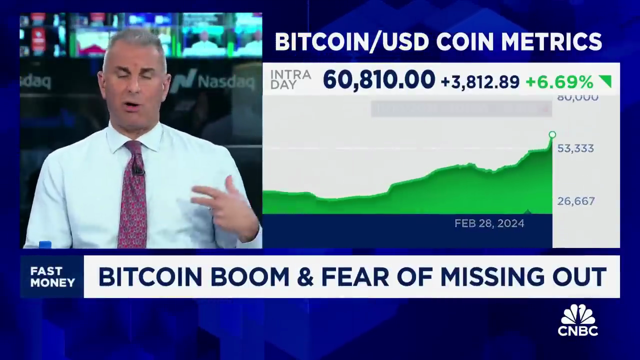

{
  "cls_name": "SceneDescription",
  "scene": "A man in a white shirt and red patterned tie is speaking on a television program. In the background, there are multiple screens displaying financial data. To the right, there is a graphic showing a green upward-trending line chart labeled 'BITCOIN/USD COIN METRICS' with the latest price point highlighted.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": [
    {
      "cls_name": "Plot",
      "type": "line",
      "title": "BITCOIN/USD COIN METRICS",
      "description": "An upward-trending line chart showing the intraday price movement of Bitcoin against USD Coin. The chart indicates a significant increase in price with the latest data point at 60,810.00 USD, which is up by 3,812.89 USD or 6.69%.",
      "markdown": "INTRA DAY\n60,810.00 +3,812.89 +6.69%",
      "caption": null
    }
  ],
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "Name not displayed",
      "is_name_shown": false
 

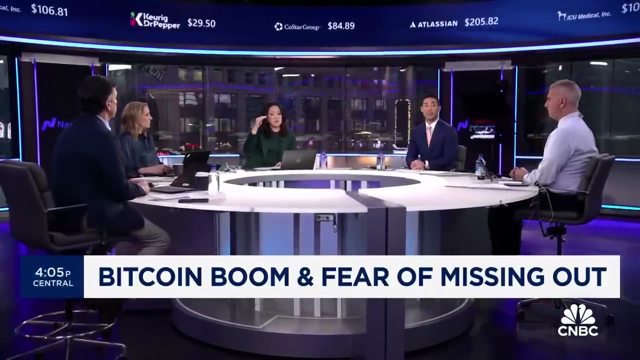

{
  "cls_name": "SceneDescription",
  "scene": "A television studio with five individuals seated around a circular desk. There are multiple screens in the background displaying stock prices. The setting appears to be a financial news broadcast.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "The ticker at the top of the screen displays various stock prices.",
    "The logo of CNBC is visible in the bottom right corner, indicating the network broadcasting this program.",
    "The time '4:05p Central' is displayed, suggesting the time zone and time of the broadcast."
  ]
}


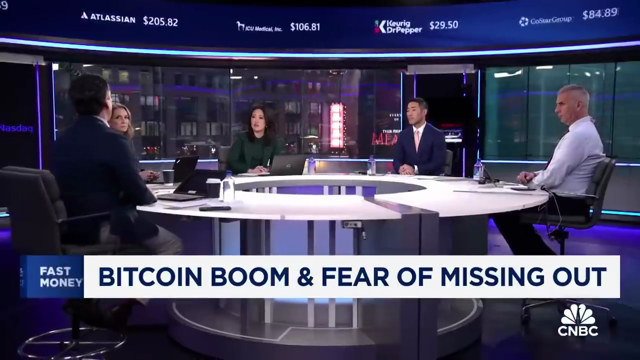

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a television studio with four individuals seated around a curved desk. They appear to be engaged in a discussion or news broadcast. The studio has a modern design with screens displaying stock information in the background.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "",
      "is_name_shown": false
    },
    {
      "cls_name": "Reporter",
      "name": "",
      "is_name_shown": false
    },
    {
      "cls_name": "Reporter",
      "name": "",
      "is_name_shown": false
    },
    {
      "cls_name": "Reporter",
      "name": "",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "Stock information displayed on screens in the background.",
    "The logo of CNBC is visible in the bottom right corner."
  ]
}


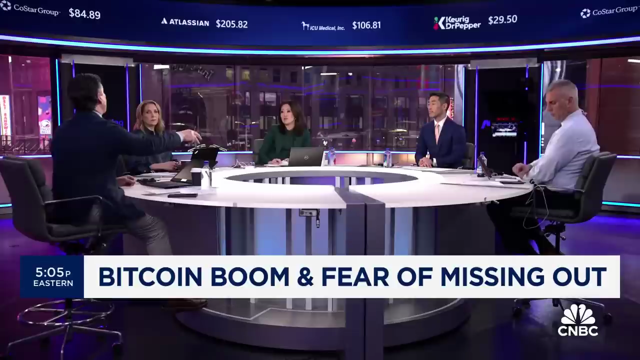

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a television studio with five individuals around a circular desk. Four of them appear to be panelists or co-hosts, and one is gesturing while speaking. The studio has a modern design with screens displaying stock prices in the background. The setting suggests a financial news program.",
  "chyron": "BITCOIN BOOM & FEAR OF MISSING OUT",
  "plots": null,
  "tables": null,
  "reporters": [
    {
      "cls_name": "Reporter",
      "name": "The names of the individuals are not displayed in the image.",
      "is_name_shown": false
    }
  ],
  "quotes": null,
  "others": [
    "The ticker at the top of the image displays stock prices for various companies such as CoStar Group, Atlassian, ICU Medical, Inc., Keurig Dr Pepper, and more.",
    "The time displayed in the bottom left corner is 5:05 PM Eastern."
  ]
}


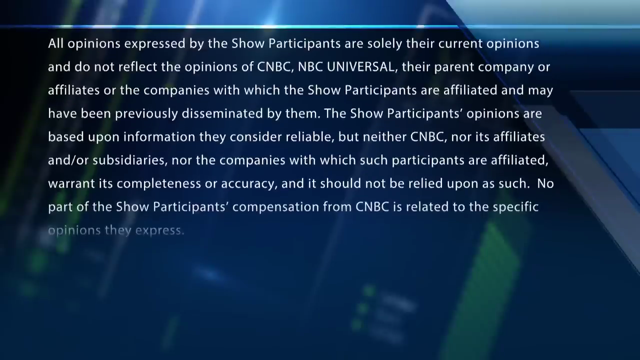

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a disclaimer text overlay on a screen, likely from a television broadcast.",
  "chyron": null,
  "plots": null,
  "tables": null,
  "reporters": null,
  "quotes": [
    {
      "cls_name": "Quote",
      "text": "All opinions expressed by the Show Participants are solely their current opinions and do not reflect the opinions of CNBC, NBC UNIVERSAL, their parent company or affiliates or the companies with which the Show Participants are affiliated and may have been previously disseminated by them. The Show Participants' opinions are based upon information they consider reliable, but neither CNBC, nor its affiliates and/or subsidiaries, nor the companies with which such participants are affiliated, warrant its completeness or accuracy, and it should not be relied upon as such. No part of the Show Participants' compensation from CNBC is related to the specific opinions they express.",
      "speaker": "Show Participants",
   

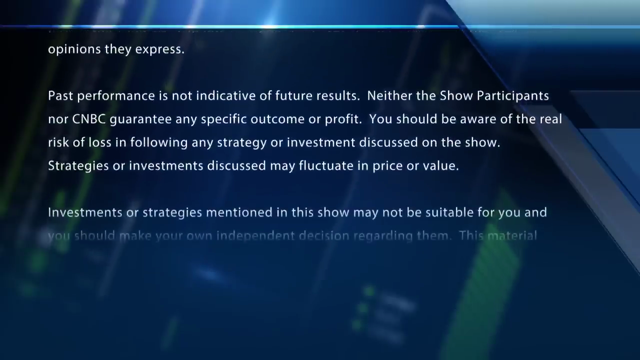

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a disclaimer text overlay on a blurred background that appears to be a financial news broadcast.",
  "chyron": null,
  "plots": null,
  "tables": null,
  "reporters": null,
  "quotes": [
    {
      "cls_name": "Quote",
      "text": "Past performance is not indicative of future results. Neither the Show Participants nor CNBC guarantee any specific outcome or profit. You should be aware of the real risk of loss in following any strategy or investment discussed on the show. Strategies or investments discussed may fluctuate in price or value. Investments or strategies mentioned in this show may not be suitable for you and you should make your own independent decision regarding them. This material",
      "speaker": "CNBC",
      "designation": null,
      "is_name_shown": false
    }
  ],
  "others": [
    "The text is a standard disclaimer often used in financial broadcasts to caution viewers about the risks associated with

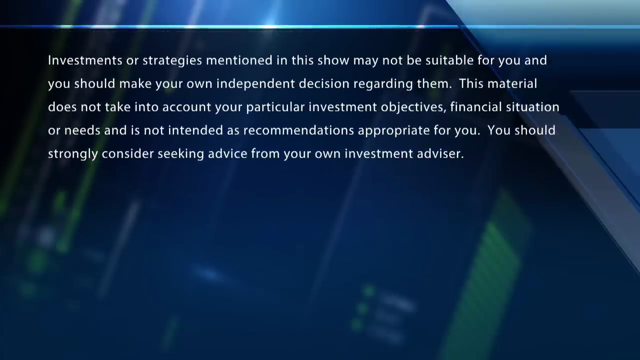

{
  "cls_name": "SceneDescription",
  "scene": "The image shows a disclaimer text overlaying a blurred background that appears to be a financial chart.",
  "chyron": null,
  "plots": null,
  "tables": null,
  "reporters": null,
  "quotes": [
    {
      "cls_name": "Quote",
      "text": "Investments or strategies mentioned in this show may not be suitable for you and you should make your own independent decision regarding them. This material does not take into account your particular investment objectives, financial situation or needs and is not intended as recommendations appropriate for you. You should strongly consider seeking advice from your own investment adviser.",
      "speaker": "Unknown",
      "designation": null,
      "is_name_shown": false
    }
  ],
  "others": null
}


In [23]:
# Read youtube video as individual frames
frames = yt_sample_video(url, start=30, end=None, skip=300)
for frame in frames:
    vlm_visualize(frame, domain="tv.news")